In [1]:
import os 
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pdb
from pyarrow import feather
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
import seaborn as sns
from scipy import spatial
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, roc_auc_score
from scipy.stats import pearsonr as cor
#from matplotlib import cm
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression
import ptitprince as pt



plt.rcParams.update({'font.size': 12.5})
plt.rcParams["figure.figsize"] = (30, 45)
plt.rcParams['axes.grid'] = True

In [2]:
#move up in directory
os.chdir('../')

from helpers import dot2_

In [3]:
os.getcwd()

'C:\\Users\\Bio_Psych\\Desktop\\Deniz\\tf-cpu\\p1_generalization'

In [4]:
# CONFIG

PATH_RNN_DATA ='data/rnn_raw_data/'
RNN_FILE_NAME = 'lstm2_a2c_nh_48_lr_0_0001_n_u_p_0_5_ew_0_vw_0_5_dr_0_5_res_d_f_p_0_1_rt_con_a_4_n_300_te_50000_id_{}_test_b_daw_p_{}'

# RNN_FILE_NAME ="lstm2_rei_nh_48_lr_0_0001_n_u_p_0_5_ew_0_vw_0_5_dr_0_5_res_d_f_p_0_1_rt_con_a_4_n_300_te_50000_id_{}_test_b_daw_p_{}"

# number of RNN instances
N_IDS = 30
# number of random walk instances
N_WALKS = 3
# number of trials per episode
N_TRIALS = 300
# number of actions/bandits
N_ACTIONS = 4

# plotting settings
my_dot_size = 10
my_alpha = 1

# PCA Analysis

C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and w

9
1


C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and w

9
2


C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and w

9
3


C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and w

9
4


C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and w

9
5


C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and w

9
6


C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and w

9
7


C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and w

9
8


C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and w

9
9


C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and w

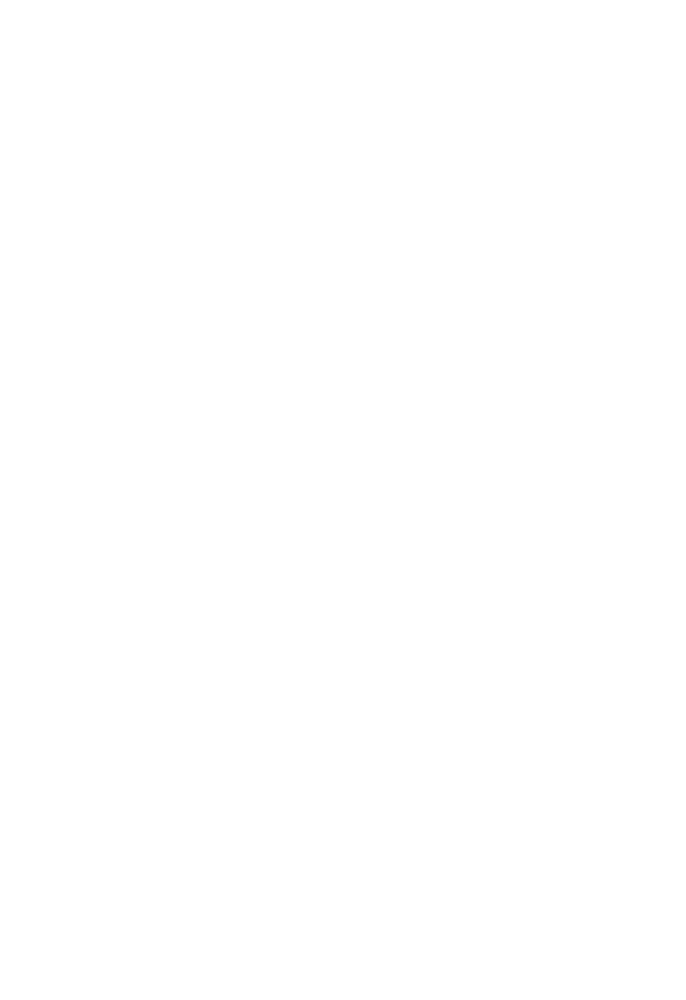

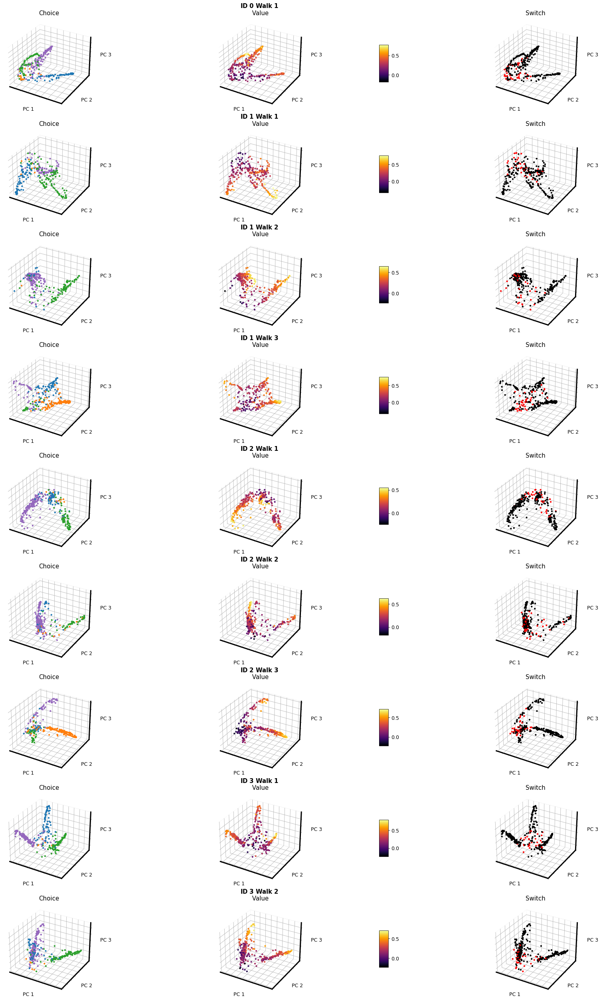

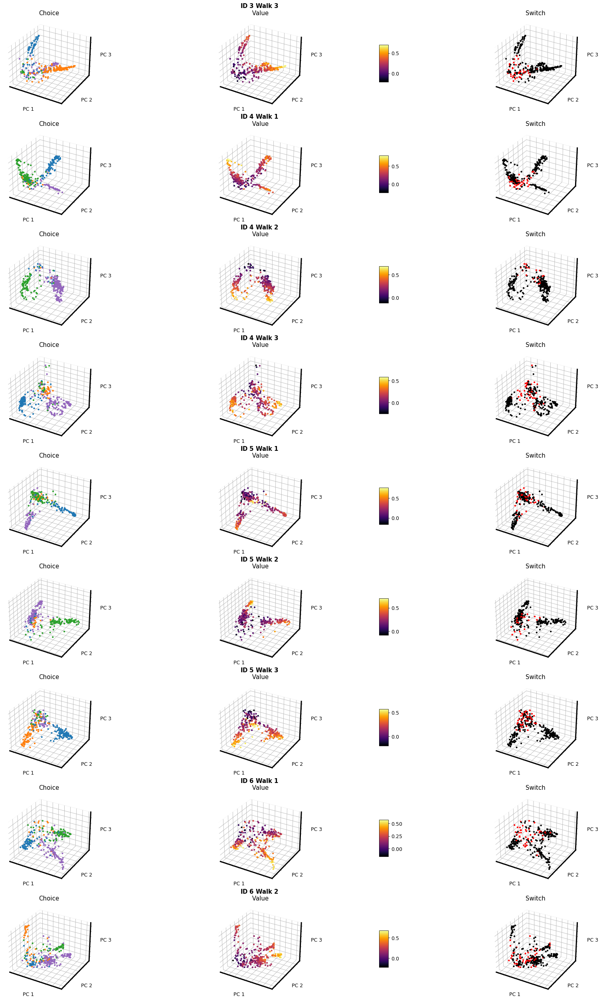

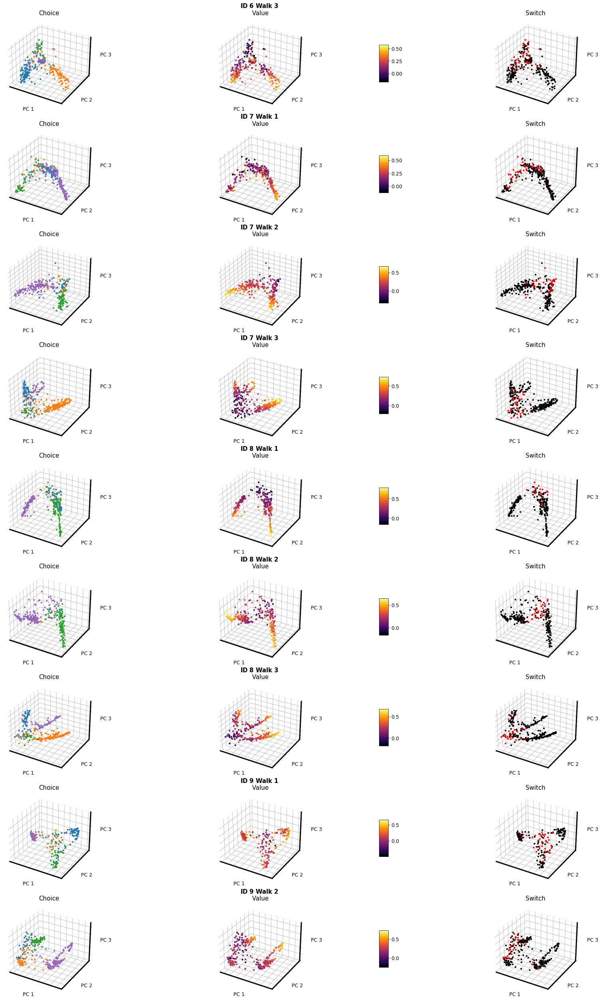

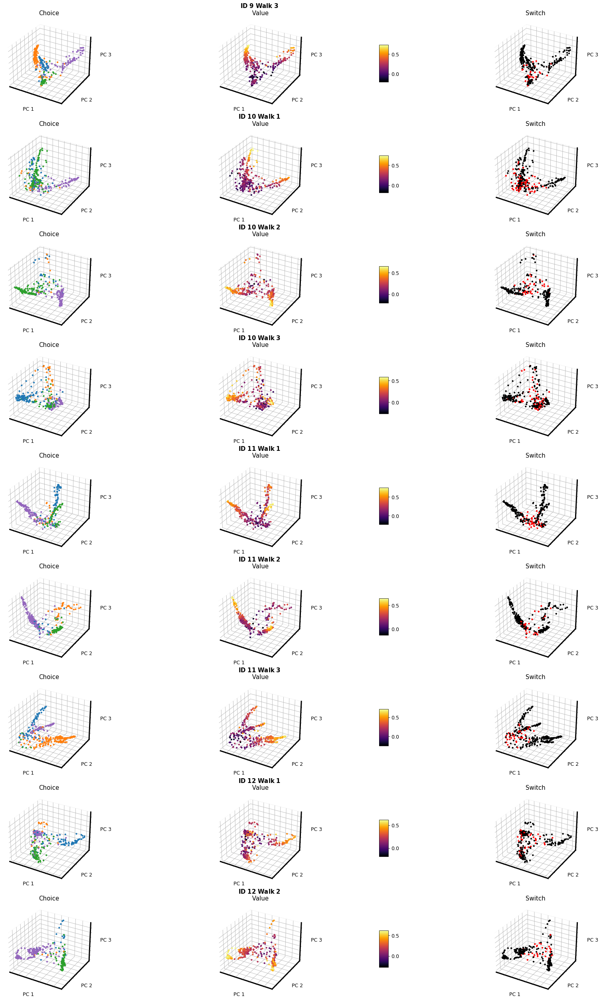

...

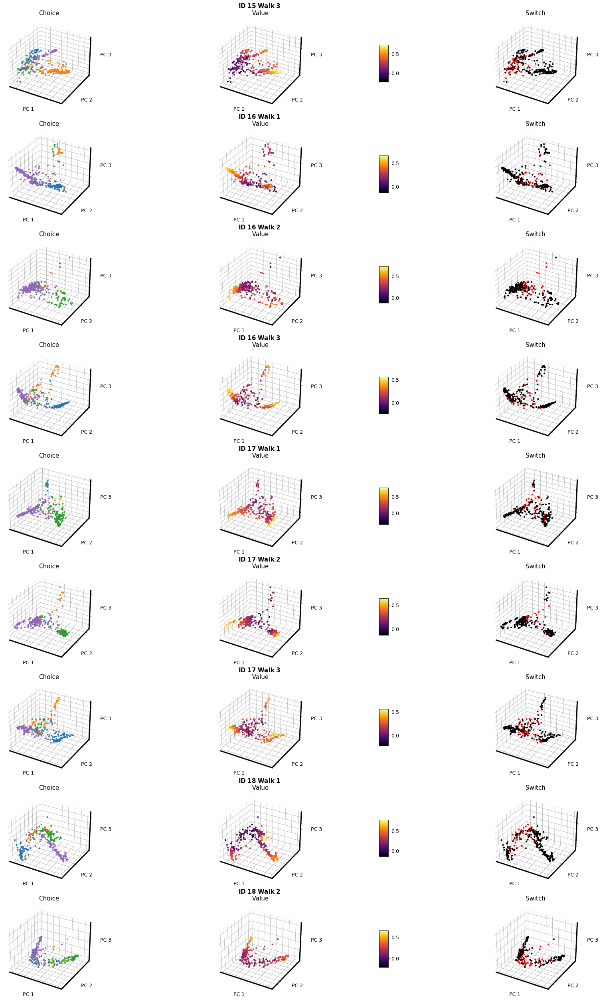

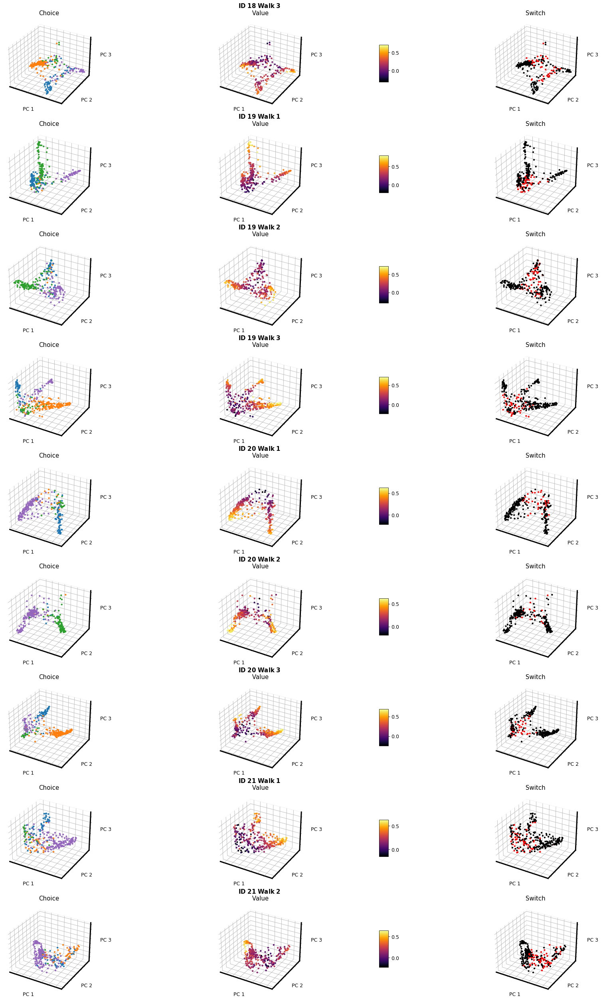

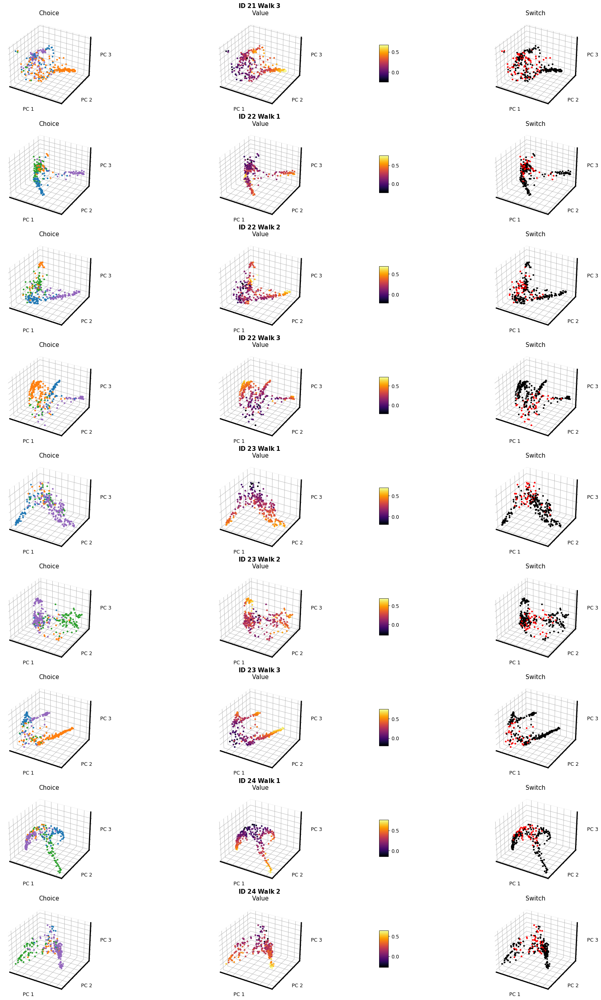

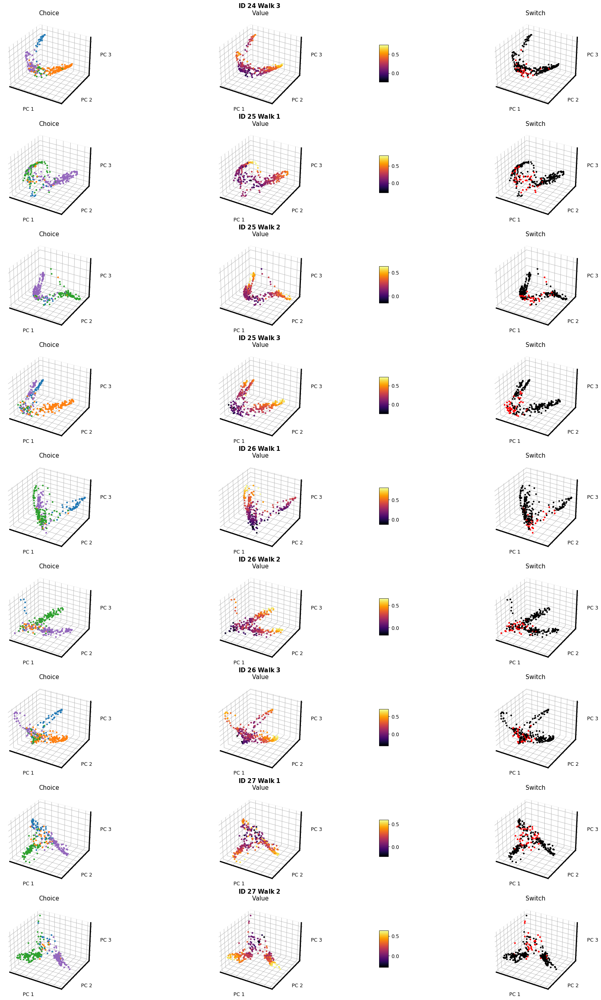

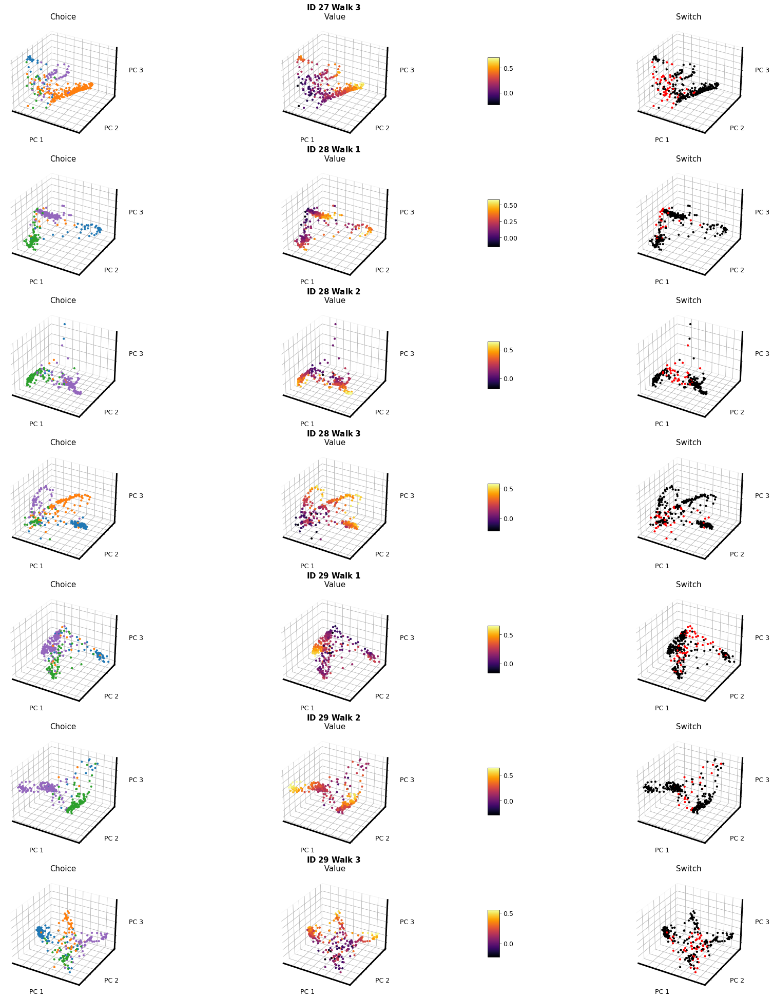

In [5]:
plt.axis('off')

rnn_file_path = PATH_RNN_DATA + RNN_FILE_NAME

# counter for row of image
i = 0
# counter for image file
j = 0

#create figure
fig = plt.figure()
spec = gridspec.GridSpec(ncols=4, nrows=9, figure=fig, width_ratios = [1,1,0.2,1])


for id_ in range(N_IDS):
    for walk in range(1, N_WALKS+1):

        d = pickle.load(open(rnn_file_path.format(id_, walk), 'rb'))
        df = d.reset_index()

        # init pca object
        pca = PCA()
        # get hidden unit activity of RNN
        hidden_units = df.loc[:, [col.startswith('rnn_state') for col in df.columns.values]]
        # standardize hidden unit activity
        st_hidden = StandardScaler().fit_transform(hidden_units)  
        # calculate principal components
        pcs = pca.fit_transform(st_hidden)

        # get x,y,z coordinates
        X, Y, Z = pcs[:,0], pcs[:,1], pcs[:,2] 

        #create figure
        #fig = plt.figure()
        
        # create main title
        #fig.suptitle('RNN ID {} Walk {}'.format(id_, walk), y = 0.75)

        # create color for choices 
        choices = df['choice'].to_numpy()
        my_ch_cols = ['tab:blue','tab:orange','tab:green','tab:purple']
        ch_col = [my_ch_cols[choices[t]] for t in range(N_TRIALS)]
    
        # create color for switches
        is_switch = df['is_switch'].to_numpy()
        my_sw_cols = ['black', 'red']
        sw_col = [my_sw_cols[is_switch[t]] for t in range(N_TRIALS)]
        
        ###############
        # First plot  #
        ###############
        #spec = gridspec.GridSpec(ncols=4, nrows=1, figure=fig, width_ratios = [1,1,0.2,1])
        #gridspec = {'width_ratios': [1, 1, 0.1, 1]}
        
        #ax = fig.add_subplot(131, projection='3d')
        ax = fig.add_subplot(spec[i,0], projection='3d')
        
        ax.scatter(X,Y,Z, color= ch_col, alpha = my_alpha, s = my_dot_size)
        ax.set_title('Choice')

        # styling
        ax.w_xaxis.pane.fill, ax.w_yaxis.pane.fill , ax.w_zaxis.pane.fill  = False, False, False
        ax.xaxis.set_tick_params(labelcolor='white', grid_alpha = 0, zorder = 1, labelsize = 0.1)
        ax.yaxis.set_tick_params(labelcolor='white', grid_alpha = 0, zorder = 1, labelsize = 0.1)
        ax.zaxis.set_tick_params(labelcolor='white', grid_alpha = 0, zorder = 1, labelsize = 0.1)
        for axis in [ax.w_xaxis, ax.w_yaxis, ax.w_zaxis]:
            axis.line.set_linewidth(3)

        # labels
        ax.set_xlabel('PC 1')
        ax.set_ylabel('PC 2')
        ax.set_zlabel('PC 3')
                
        #############
        # 2nd plot  #
        #############
        ax = fig.add_subplot(spec[i,1], projection='3d')
        x = ax.scatter(X,Y,Z, c= df['value'], alpha = my_alpha, cmap = 'inferno', label = 'Value',  s = my_dot_size)
        ax.set_title( r"$\bf{"+'ID'+"}$" + " " + r"$\bf{"+str(id_)+"}$" +" "+ r"$\bf{"+'Walk'+"}$" + " "+ r"$\bf{"+str(walk)+"}$"
                     + '\n Value')

        # styling
        ax.w_xaxis.pane.fill, ax.w_yaxis.pane.fill , ax.w_zaxis.pane.fill  = False, False, False
        ax.xaxis.set_tick_params(labelcolor='white', grid_alpha = 0, zorder = 1, labelsize = 0.1)
        ax.yaxis.set_tick_params(labelcolor='white', grid_alpha = 0, zorder = 1, labelsize = 0.1)
        ax.zaxis.set_tick_params(labelcolor='white', grid_alpha = 0, zorder = 1, labelsize = 0.1)
        for axis in [ax.w_xaxis, ax.w_yaxis, ax.w_zaxis]:
            axis.line.set_linewidth(3)
        
        # labels
        ax.set_xlabel('PC 1')
        ax.set_ylabel('PC 2')
        ax.set_zlabel('PC 3')
    
        #####################################
        # 3rd plot = colorbar for 2nd plot  #
        #####################################
        ax = fig.add_subplot(spec[i,2])
        axins = inset_axes(ax,
            width="25%",  
            height="40%",
            loc='center left',
            borderpad=0
           )
        
        plt.colorbar(x,cax = axins)    
        ax.axis('off')
    
        #############
        # 4rd plot  #
        #############
        ax = fig.add_subplot(spec[i,3], projection='3d')
        ax.scatter(X,Y,Z, color = sw_col, alpha = my_alpha,  s = my_dot_size)
        ax.set_title('Switch')

        # styling
        ax.w_xaxis.pane.fill, ax.w_yaxis.pane.fill , ax.w_zaxis.pane.fill  = False, False, False
        ax.xaxis.set_tick_params(labelcolor='white', grid_alpha = 0, zorder = 1, labelsize = 0.1)
        ax.yaxis.set_tick_params(labelcolor='white', grid_alpha = 0, zorder = 1, labelsize = 0.1)
        ax.zaxis.set_tick_params(labelcolor='white', grid_alpha = 0, zorder = 1, labelsize = 0.1)
        for axis in [ax.w_xaxis, ax.w_yaxis, ax.w_zaxis]:
            axis.line.set_linewidth(3)
        # labels
        ax.set_xlabel('PC 1')
        ax.set_ylabel('PC 2')
        ax.set_zlabel('PC 3')
        
        # increment
        i +=1
        
        # periodically save
        if (i)%9==0:
            print(i)
            print(j+1)
            # save figure
            plt.savefig('../p1_generalization/plots/3d_plot_all_{}.png'.format(j+1), dpi = 300)
            # reset row counter
            i = 0
            # increment plot counter
            j +=1

            #create figure
            fig = plt.figure()
            spec = gridspec.GridSpec(ncols=4, nrows=9, figure=fig, width_ratios = [1,1,0.2,1]) # save 9*4 grid

        
        # save figure
        if id_ == 0:
            plt.savefig('../p1_generalization/plots/3d_plot_id_{}_walk_{}.png'.format(id_, walk), dpi = 600, bbox_inches='tight')
            break


# Targeted dimensionality reduction

In [6]:
# function to calculate scatter index as in Ebitz et al. 2018
def get_scatter_index(point, within_cluster, between_cluster):
    # distance within
    d_within = np.sum(np.linalg.norm(point-within_cluster, axis = 1))
    # distance between
    d_between = np.sum(np.linalg.norm(point-between_cluster, axis = 1))
    # scatter index
    scatter_index = d_within/d_between
    return(scatter_index)

In [7]:
rnn_file_path = PATH_RNN_DATA + RNN_FILE_NAME

# container for choice axis for all RNN instances 
choice_axis = np.zeros([N_IDS*N_WALKS,N_TRIALS, N_ACTIONS])
# container for choice axis (probability scale) for all RNN instances 
choice_axis_proba = np.zeros([N_IDS*N_WALKS,N_TRIALS, N_ACTIONS])
# container for switch axis for all RNN instances 
switch_axis = np.zeros([N_IDS*N_WALKS,N_TRIALS])
# container for switch axis (probability scale) for all RNN instances 
switch_axis_proba = np.zeros([N_IDS*N_WALKS,N_TRIALS])
# container for value axis for all RNN instances 
value_axis = np.zeros([N_IDS*N_WALKS,N_TRIALS])
# collect previous reward
prev_rew = np.zeros([N_IDS*N_WALKS,N_TRIALS])
# collect switch trials
is_switch = np.zeros([N_IDS*N_WALKS,N_TRIALS])
# collect value output
values = np.zeros([N_IDS*N_WALKS,N_TRIALS])
# collect scatter index 
scatter_index = np.zeros([N_IDS*N_WALKS,N_TRIALS])
# collect choice predictions
choice_preds = np.zeros([N_IDS*N_WALKS,N_TRIALS])
# collect noise added to hidden units
weber_noise = np.zeros([N_IDS*N_WALKS,N_TRIALS])
# container for switch choice axis for all RNN instances 
switch_choice_axis = np.zeros([N_IDS*N_WALKS,N_TRIALS, N_ACTIONS])
# container for switch choice axis (probability scale) for all RNN instances
switch_choice_axis_proba = np.zeros([N_IDS*N_WALKS,N_TRIALS, N_ACTIONS])
# container for choices for all RNN instances
all_choices = np.zeros([N_IDS*N_WALKS,N_TRIALS])

for walk in range(1, N_WALKS+1):
    for id_ in range(N_IDS):

        # get data from RNN instance
        d = pickle.load(open(rnn_file_path.format(id_, walk), 'rb'))
        df = d.reset_index()
        # get choices
        choices = df.choice.to_numpy()
        # extract hidden unit activity
        hidden_units = df.loc[:, [col.startswith('rnn_state') for col in df.columns.values]]
        # extract weber noise
        noise = df.loc[:, [col.startswith('added_noise_rnn_state') for col in df.columns.values]]
        # collect norm of weber noise
        weber_noise[(walk-1)*N_IDS+id_] = np.linalg.norm(noise.to_numpy(), axis = 1)
        # onehot encoding for choices
        oh_choices = pd.get_dummies(df.choice).to_numpy()
        
        # prepare empty vector for choice predictions
        tmp_choice_vec = np.zeros(N_TRIALS)
        
        # init pca object
        pca = PCA()
        # standardize hidden unit activity
        st_hidden = StandardScaler().fit_transform(hidden_units)  
        # predictor X is principal components
        X = pca.fit_transform(st_hidden)
        #X = hidden_units
        #########################
        # choice axis 
        #########################
                
        for a in range(N_ACTIONS):

            # get choice axis: binary logistic regression for each action
            y = oh_choices[:,a]
            clf = LogisticRegression(random_state=0, fit_intercept=True).fit(X, y)
            # save linear combination as axis
            choice_axis[(walk-1)*N_IDS+id_,:,a] = np.dot(X,np.transpose(clf.coef_)).flatten() + clf.intercept_
            # save probability
            choice_axis_proba[(walk-1)*N_IDS+id_,:,a] = clf.predict_proba(X)[:,1]
            # save choice predictions for action a
            clf = LogisticRegression(random_state=0, fit_intercept=True).fit(X, y)
            tmp_choice_vec[choices==a] = clf.predict(X)[choices==a]

        #########################
        # choice predictions 
        #########################
        
        # save choice predictions for all actions
        choice_preds[(walk-1)*N_IDS+id_,:] = tmp_choice_vec
                
        #####################
        # switch choice axis 
        #####################
        # axis shows log probs of switching to a choice i
        
        # create switch predictor with dim (N_Trials, N_ACTIONS) by repeating is_switch N_ACTION times
        oh_switches = np.transpose(np.reshape(np.tile(df.is_switch.values, N_ACTIONS), (N_ACTIONS, N_TRIALS)))
        # elementwise multiplication (interaction term)
        oh_switch_choices = np.multiply(oh_choices, oh_switches)
        
        for a in range(N_ACTIONS):

            # get choice axis: binary logistic regression for each action
            y = oh_switch_choices[:,a]
            clf = LogisticRegression(random_state=0, fit_intercept=True).fit(X, y)
            # save linear combination as axis
            switch_choice_axis[(walk-1)*N_IDS+id_,:,a] = np.dot(X,np.transpose(clf.coef_)).flatten() + clf.intercept_
            # save probability
            switch_choice_axis_proba[(walk-1)*N_IDS+id_,:,a] = clf.predict_proba(X)[:,1]
            # save choice predictions for action a
            clf = LogisticRegression(random_state=0, fit_intercept=True).fit(X, y)
        
        #########################
        # scatter indesx 
        #########################
            
        # save scatter index
        ch_axis_plane = choice_axis[(walk-1)*N_IDS+id_]
        scatter_index[(walk-1)*N_IDS+id_,:] = [get_scatter_index(point = ch_axis_plane[t, :],
                                                               within_cluster = ch_axis_plane[df.choice.to_numpy() == df.choice.to_numpy()[t],:],
                                                               between_cluster = ch_axis_plane[df.choice.to_numpy() != df.choice.to_numpy()[t],:]) for t in range(N_TRIALS)]
            
                
        #########################
        # switch axis 
        #########################
        
        # get switch axis: binary logistic regression for switches
        #X = hidden_units
        y = df.is_switch
        clf = LogisticRegression(random_state=0, fit_intercept=True).fit(X, y)
        # get linear combination as axis
        switch_axis[(walk-1)*N_IDS+id_, :] = np.dot(X,np.transpose(clf.coef_)).flatten() + clf.intercept_
        # save probability
        switch_axis_proba[(walk-1)*N_IDS+id_, :] = clf.predict_proba(X)[:,1]
                    
        #########################
        # value axis 
        #########################
    
        # get value axis: linear regression for values
        #X = hidden_units
        y = df.value
        lr = LinearRegression().fit(X, y)
        # get linear combination as axis
        value_axis[(walk-1)*N_IDS+id_, :] = np.dot(X,np.transpose(lr.coef_)).flatten() + lr.intercept_
        
                
        #########################
        # variable collection 
        #########################
        
        # get previous reward
        prev_rew[(walk-1)*N_IDS+id_, :] = pd.Series(df.reward).shift(1).to_numpy()
        
        # get switch trials 
        is_switch[(walk-1)*N_IDS+id_, :] = df.is_switch.to_numpy()
        
        # get choices
        all_choices[(walk-1)*N_IDS+id_, :] = choices
        
        # get values
        values[(walk-1)*N_IDS+id_, :] = df.value.to_numpy()

In [8]:
# styling for following plots
plt.rcParams["figure.figsize"] = (7, 7)

In [135]:
# plot accuracy for stay and switch
ids = list(np.repeat(np.linspace(0,N_IDS-1, N_IDS),N_TRIALS))*N_WALKS
walks = list(np.repeat(np.linspace(0,N_WALKS-1, N_WALKS), N_TRIALS*N_IDS))
df = pd.DataFrame({'id': ids,
                   'walk': walks,
              'preds': choice_preds.flatten(),
              'is_switch': is_switch.flatten()})

# accurate switch target predictions
accurate_switch_preds = choice_preds.flatten()[is_switch.flatten()==1]

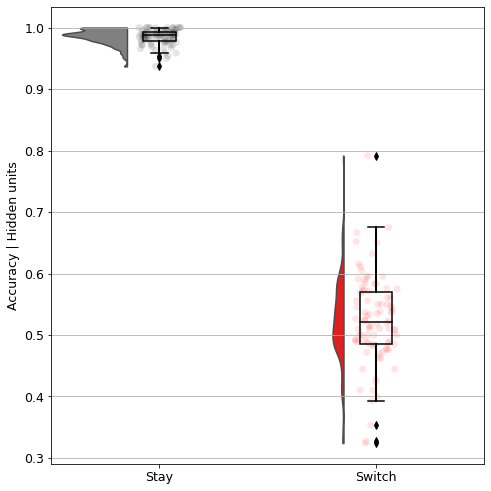

In [9]:



stay_switch_accuracy = df.groupby(['id', 'walk','is_switch']).mean()
df = stay_switch_accuracy.reset_index()

switch_accuracy = df[df['is_switch']==1]['preds'].to_numpy()
stay_accuracy = df[df['is_switch']==0]['preds'].to_numpy()

# plotting
plot_df = pd.DataFrame({"accuracy": list(stay_accuracy) + list(switch_accuracy),
                       "type": ['Stay'] * len(stay_accuracy)  + ['Switch'] * len(switch_accuracy)})

# plotting the clouds
f, ax = plt.subplots()
dy="accuracy"; dx="type"; ort="v"; pal = {"Stay": "grey", "Switch": "red"}#sns.color_palette(n_colors=2)
ax=pt.half_violinplot( x = dx, y = dy, data = plot_df, palette = pal, bw = .2, cut = 0.,
                      scale = "area", width = .6, inner = None, orient = ort)


pal1 = {"Stay": "black", "Switch": "red"}
ax=sns.stripplot( x = dx, y = dy, data = plot_df, palette = pal1, edgecolor = "white",
size = 7, jitter = 1, zorder = 0, orient = ort, alpha = 0.1)

x=sns.boxplot( x = dx, y = dy, data = plot_df, color = "black", width = .15, zorder = 10,\
showcaps = True, boxprops = {'facecolor':'none', "zorder":10},\
showfliers=True, whiskerprops = {'linewidth':2, "zorder":10},\
saturation = 1, orient = ort)

plt.ylabel('Accuracy | Hidden units')
plt.xlabel('')

plt.tight_layout()

plt.savefig('../p1_generalization/plots/fig_5_F.png', dpi = 600)

In [10]:
plot_df.groupby('type').mean()

,accuracy
type,
Stay,0.984748
Switch,0.523512


In [11]:
# save data for jasp analysis
plot_df = plot_df[plot_df['type']=='Switch']
plot_df.to_csv('data/intermediate_data/jasp_analysis/switch_accuracy_t_test_data.csv')

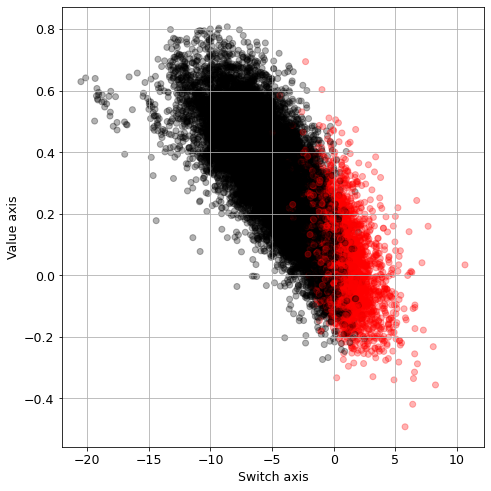

In [12]:
# create color for switches
my_sw_cols = ['black', 'red']
sw_col = [my_sw_cols[int(is_switch.flatten()[t])] for t in range(np.shape(is_switch.flatten())[0])]

plt.scatter(switch_axis, value_axis, c = sw_col, alpha = 0.3)
plt.xlabel('Switch axis')
plt.ylabel('Value axis')
plt.tight_layout()

plt.savefig('../p1_generalization/plots/fig_5_E.png', dpi = 600)

In [13]:
# save data for jasp analysis
plot_df = pd.DataFrame({"switch_axis": switch_axis.flatten(),
                       "value_axis":value_axis.flatten()})

plot_df.to_csv('data/intermediate_data/jasp_analysis/switch_axis_value_axis_data.csv')

In [14]:
np.corrcoef(x = switch_axis.flatten(), y = value_axis.flatten())

array([[ 1.       , -0.8007447],
       [-0.8007447,  1.       ]])

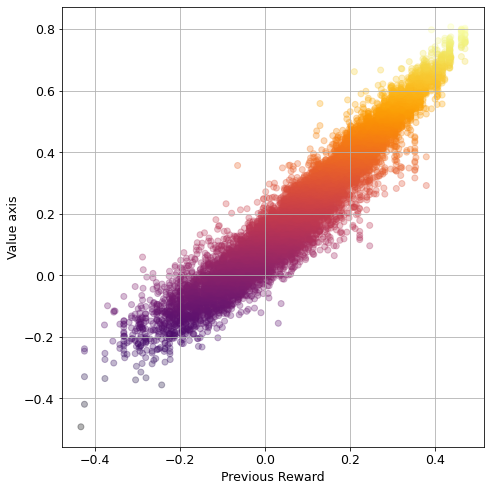

In [15]:
plt.scatter(prev_rew[:,1:], value_axis[:,1:], c = values[:,1:].flatten(), cmap = 'inferno', alpha = 0.3)
plt.xlabel('Previous Reward')
plt.ylabel('Value axis')
plt.tight_layout()

plt.savefig('../p1_generalization/plots/fig_5_D.png', dpi = 600)

In [16]:
# save data for jasp analysis
plot_df = pd.DataFrame({"previous_reward": prev_rew[:,1:].flatten(),
                       "value_axis":value_axis[:,1:].flatten()})

plot_df.to_csv('data/intermediate_data/jasp_analysis/previous_reward_value_axis_data.csv')


In [17]:
np.corrcoef(x = prev_rew[:,1:].flatten(), y = value_axis[:,1:].flatten())

array([[1.        , 0.96625142],
       [0.96625142, 1.        ]])

# Analysis regarding unique bandit heuristic

In [18]:
def get_unique_bandit_heuristic(my_choice, choice):
    
    n_trials = len(choice)
    other_choices = []
    unq_b_vec = np.zeros(n_trials)

    for t in range(n_trials):
        if choice[t] != -1: # if -1 choice is invalid
            if choice[t] != my_choice:

                other_choices.append(choice[t])
                unq_b_vec[t] = len(np.unique(other_choices))

            if choice[t] == my_choice:

                other_choices = []
                unq_b_vec[t] = 0
                
    return(unq_b_vec)

In [59]:
all_lagged_ch_unc = np.zeros([N_IDS*N_WALKS,N_TRIALS])

for id_ in range(N_IDS):
    for walk in range(1,N_WALKS + 1):

        d = pickle.load(open(PATH_RNN_DATA + RNN_FILE_NAME.format(id_, walk), 'rb'))
        rnn_df = d.reset_index()
        choice = rnn_df['choice'].values

        # uncertainty value at t
        unq_bandit_array = np.zeros([len(choice),N_ACTIONS])
        # shift 1 to get uncertainty value t-1 for choice t
        shifted_unq_bandit_array = np.zeros([len(choice),N_ACTIONS])

        for b in range(N_ACTIONS):
            unq_bandit_array[:,b] = get_unique_bandit_heuristic(my_choice = b, choice = choice)
            shifted_unq_bandit_array[:,b] = pd.Series(unq_bandit_array[:,b]).shift(1)

        # get shifted uncertainty of chosen actions
        lagged_ch_unc = [shifted_unq_bandit_array[t,:][choice[t]] for t in range(len(choice))]

        # get uncertainty of switch trials    
        switch_indices = np.where(rnn_df['is_switch'] == 1)    
        n_switches = np.shape(switch_indices)[1]
        ch_unc_at_switch = np.array(lagged_ch_unc)[switch_indices]
        
        # variable collection
        all_lagged_ch_unc[(walk-1)*N_IDS+id_, :] = lagged_ch_unc

In [60]:
# GET DATA FOR FINAL PLOT

#### HIER WEITER, GGF. relative probability

# container for action probs by unq bandit
# probs_by_unq_1 = np.empty((N_WALKS * N_IDS,N_TRIALS))
# probs_by_unq_2 = np.empty((N_WALKS * N_IDS,N_TRIALS))
# probs_by_unq_3 = np.empty((N_WALKS * N_IDS,N_TRIALS))
all_switch_target_choice_probs = []
all_ids = []
all_walks = []
all_switch_target_ch_unc = []


for id_ in range(N_IDS):
    for walk in range(1,N_WALKS + 1):
        
        my_index = (walk-1)*N_IDS+id_
        
        # get only choice probs at switch trials
        choice_probs_at_switch = choice_axis_proba[my_index,is_switch[my_index,:]==1,:]
        switch_choices = all_choices[my_index,is_switch[my_index,:]==1]
        
        # get only choice probs at switch trials of switch target actions
        choice_probs_at_switch_and_actions = [choice_probs_at_switch[i,int(a)] for i, a in enumerate(switch_choices)] 
        
        all_switch_target_choice_probs.extend(choice_probs_at_switch_and_actions)
        all_ids.extend([id_]*len(choice_probs_at_switch_and_actions))
        all_walks.extend([walk]*len(choice_probs_at_switch_and_actions))
        all_switch_target_ch_unc.extend(all_lagged_ch_unc[my_index,is_switch[my_index,:]==1])


In [156]:
# filter only accurate switch target preds
correct_preds = accurate_switch_preds==1)

numpy.ndarray

In [158]:
type(all_switch_target_choice_probs)

list

In [159]:
np.array(all_switch_target_choice_probs)[accurate_switch_preds==1]

array([0.60585625, 0.64579757, 0.9837408 , ..., 0.8415534 , 0.78820946,
       0.54025045])

In [160]:
df = pd.DataFrame({'p': np.array(all_switch_target_choice_probs)[correct_preds],
                   'unc': np.array(all_switch_target_ch_unc)[correct_preds],
                   'id': np.array(all_ids)[correct_preds],
                   'walk': np.array(all_walks)[correct_preds]})

In [161]:
# beware VERY ugly

ind_data = df.groupby(['unc', 'id', 'walk']).mean().reset_index().pivot(columns='unc', index=['id', 'walk'], values = 'p').values

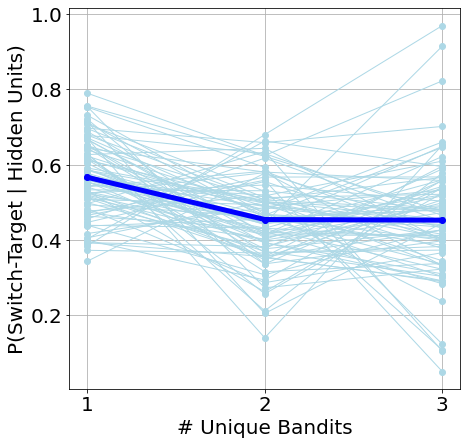

In [162]:
plt.rcParams.update({'font.size': 20})
plt.rcParams["figure.figsize"] = (7, 7)

for i in range(1,np.shape(ind_data)[0]):
    plt.plot(range(1,N_ACTIONS), ind_data[i,:], '-o', c = 'lightblue', linewidth=1)

plt.plot(range(1,N_ACTIONS), df.groupby('unc').mean()['p'].values, '-o', c = 'blue',  linewidth=5.)
plt.xticks(np.arange(1,N_ACTIONS, 1))
plt.ylabel("P(Switch-Target | Hidden Units)")
plt.xlabel("# Unique Bandits")

plt.savefig('../p1_generalization/plots/fig_5_F_new_only_accurate.png', dpi = 600)

array([1, 2, 3])